Mount Google Colab Folder

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Import the Abalone dataset

In [2]:
from IPython import get_ipython
from IPython.display import display
# %%
# Use a library like Pandas to read the CSV file into a DataFrame.
import pandas as pd
# %%
file_path = "/content/gdrive/MyDrive/Colab Notebooks/Intro to CI/Assignment task 3/abalone.csv"
# %%
# The read_csv function from pandas to read the data from the CSV file into a pandas DataFrame
df = pd.read_csv(file_path)
# Displays the first few rows of the DataFrame
df.head(5)

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


Import libraries


In [3]:
# Standard libraries
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch
import torch.nn.functional as F
from torch.nn import init
import math
from sklearn.utils import shuffle
from torch.autograd import Variable
from torch.utils.tensorboard import SummaryWriter
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Package for FCM clustering
!pip install fuzzy-c-means
from fcmeans import FCM

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 88.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.3 MB/s eta 0:00:00
  Attempting uninstall: typer
    Found existing installation: typer 0.15.3
    Uninstalling typer-0.15.3:
      Successfully uninstalled typer-0.15.3
  Attempting uninstall: tabulate
    Found existing installation: tabulate 0.9.0
    Uninstalling tabulate-0.9.0:
      Successfully uninstalled tabulate-0.9.0
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.4.0 requires tabulate>=0.9, but you have tabulate 0.8.10 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.

Random Seed

In [4]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
torch.manual_seed(21)
torch.cuda.manual_seed(21)

Define the Fuzzy Memberships

In [5]:
# Define the membership function layer
class Fuzzy_MF_Layer(nn.Module):
    """ Membership layer """
    def __init__(self, input_dim, n_rules,fcm_centers=None,update=True):
        super().__init__()
        self.n_rules = n_rules
        self.input_dim = input_dim
        self.fcm_centers = fcm_centers
        centers = torch.Tensor(self.input_dim, self.n_rules)
        self.centers = nn.Parameter(centers,requires_grad=update)  # nn.Parameter is a Tensor that's a module parameter.
        widths = torch.Tensor(self.input_dim, self.n_rules)
        self.widths = nn.Parameter(widths,requires_grad=update)
        self.reset_parameters()
    def reset_parameters(self) -> None:
        bound=1
        if self.fcm_centers is None:
          nn.init.uniform_(self.centers, 0, bound)
        else:
          self.centers = nn.Parameter(self.fcm_centers)
        print("center shape",self.centers.shape)
        nn.init.uniform_(self.widths, 0.1, bound)
    # A new function is defined in response to rebuild the antecedent (membership) layer
    def add_single_fuzzy_set(self,data_point,p):
        # data_point is a single data sample
        # p is the one centre of the fuzzy set that most fires the data_point
        self.n_rules += 1
        # 1. Rebuild Centers
        # 1.1 Create a new center with the data_points position
        new_cen = torch.unsqueeze(data_point, dim=-1)
        # 1.2 merge the new center into the "centers" parameter
        new_centers = torch.cat((self.centers, new_cen), -1)
        self.centers = nn.Parameter(new_centers,requires_grad=True)
        # 2. Rebuild widths
        # 2.1 The width of the new fuzzy set is set to be the
        # distance between the data point and the one centre of
        # the fuzzy set that most fires the data_point
        new_wid = 0.01 +  torch.abs(self.centers[:,p] - data_point)*1.0 #min width + difference between the two
        new_wid = torch.unsqueeze(new_wid, dim=-1)
        # 2.2 merge the new width into the "widths" parameter
        new_widths = torch.cat((self.widths, new_wid), -1)
        self.widths = nn.Parameter(new_widths,requires_grad=True)
    def forward(self, x):
        aligned_x = torch.repeat_interleave(torch.unsqueeze(x, -1), repeats=self.n_rules, dim=-1)
        aligned_c = self.centers
        aligned_a = torch.clamp(self.widths,0.1)
        prot=(aligned_x - aligned_c) / aligned_a
        root=-0.5*torch.square(prot)
        xc = torch.exp(root)
        return xc

In [6]:
# define the fuzzy rule layer
class Fuzzy_Rule_Layer(nn.Module):
    def __init__(self, **kwargs):
        super(Fuzzy_Rule_Layer, self).__init__(**kwargs)
    def forward(self, x):
        # dim -2 is the dimension of rules
        sums = torch.prod(x,axis=-2,keepdims=False)
        return sums

In [7]:
# define the defuzzify layer
class Defuzzy_Layer(nn.Module):
    def __init__(self, n_rules, output_dim, **kwargs):
        super(Defuzzy_Layer, self).__init__(**kwargs)
        self.n_rules = n_rules
        self.output_dim = output_dim
        self.weight = nn.Parameter(torch.empty((output_dim, n_rules)))
        self.reset_parameters()
    # This function is defined in response to rebuild the consequent layer
    def add_single_rule_consequent(self):
        self.n_rules+=1
        # 1. Initialize new weight for a single rule
        new_weight = nn.Parameter(torch.empty((self.output_dim,1))).to(device)
        init.kaiming_uniform_(new_weight, a=math.sqrt(5))
        # 2. Merge the new weight into the "weight" parameter
        new_weights = torch.cat((self.weight, new_weight), dim=-1)
        self.weight = nn.Parameter(new_weights,requires_grad=True)
    def reset_parameters(self) -> None:
        init.kaiming_uniform_(self.weight, a=math.sqrt(5))
    def forward(self, x):
        numerator = F.linear(x, self.weight)
        denominator = x.sum(-1).unsqueeze(-1)
        output = torch.div(numerator,denominator)
        return output

Define SONFIN

In [8]:
# Define SONFIN
class SONFINClassifier(nn.Module):
    def __init__(self, input_dim, n_rules,output_dim,ini_centers=None):
        super(SONFINClassifier, self).__init__()
        # Initialize the modules we need to build the network
        self.n_rules=n_rules
        # Here we define the tolerance of generation of new rules
        self.phi_th=0.5
        self.mf_layer = Fuzzy_MF_Layer(input_dim,n_rules,ini_centers)
        self.rule_layer = Fuzzy_Rule_Layer()
        self.output_layer = Defuzzy_Layer(n_rules,output_dim)
    # And a function that returns firing strenght of input daa
    def get_FS(self, x):
        x = self.mf_layer(x)
        FS = self.rule_layer(x)
        return FS
    def forward(self, x):
        # Perform the calculation of the model to determine the prediction
        x = self.mf_layer(x)
        x = self.rule_layer(x)
        output = self.output_layer(x) # To check with the loss functiom
        return output
    # This function rebuilds the model itself
    def rebuild(self, batch_x):
        has_rebuilt=False
        for t in range(batch_x.size(0)): # for each data point in the batch
          x = batch_x[t]
          # 1.Judge if we need a new center for this data point
          # 1.1. We first get the firing strengths of all rules on this data point
          FS = self.get_FS(x)
          # 1.2. Let's the max firing strength
          phi_max= torch.max(FS) # firing strenghs
          # 1.3. and which rule max firing it
          p=torch.argmax(FS)
          # 1.4. If the max firing is too low (low than our tolerance)
          if (phi_max<self.phi_th): #phi_th is the tolerance of min FS (0.1), then new rule is needed
            # 2. We then add a new rule for this data point
            self.n_rules+=1
            # 2.1. Add a fuzzy set that prototypes the new rule
            self.mf_layer.add_single_fuzzy_set(x,p)
            # 2.2. Add consequents for the rule that defuzzifies the firing Strength
            self.output_layer.add_single_rule_consequent()
            has_rebuilt=True
        # We want to decay our tolerance each time we rebuild our FNN
        if has_rebuilt==True:
          self.phi_th*=0.5 # decay 50% each time
        return has_rebuilt

Train SONFIN

### SONFIN with Random initialization


In [9]:
# Load the abalone dataset
df = pd.read_csv(file_path)
# Separate features and labels
age_column_name = df.columns[8] # Replace with the actual column name if known

# Define age bins and labels
# You might need to adjust these bins based on your data's age distribution
age_column_name = 'Rings'
bins = [0, 9, 18, df[age_column_name].max()] # Example bins for infant, adult, elderly
labels_string = ['infant', 'adult', 'elder'] # Store the original string labels

# Create a new binned age column
df['Age_Binned'] = pd.cut(df[age_column_name], bins=bins, labels=labels_string, include_lowest=True)

# Drop the original 'Age' column (optional, but often done after binning)
df = df.drop(columns=[age_column_name])

# Separate features and labels again with the new binned feature
# Handle categorical features, including the new 'Age_Binned' column
# Identify categorical columns (assuming 'Sex' and the new 'Age_Binned')
categorical_cols = ['Sex', 'Age_Binned'] # Add 'Age_Binned' here

# Apply one-hot encoding to the categorical columns
df = pd.get_dummies(df, columns=categorical_cols, drop_first=True) # drop_first to avoid multicollinearity

# Separate features and labels again
features = df.values

# Extract the binned age column as labels
# Based on the original code, it seems 'Age_Binned' is the target variable.
# We need to get the values from the 'Age_Binned' column *before* dropping it
# for feature separation or from the original df if it wasn't dropped or
# if we are targeting the bins themselves.

# Re-read or use the original df before the first feature/label separation attempt
df = pd.read_csv(file_path)

# Define age bins and labels
age_column_name = 'Rings'
bins = [0, 8, 15, df[age_column_name].max()]
labels_string = ['infant', 'adult', 'elderly']

# Create a new binned age column which will be our target variable
df['Age_Binned'] = pd.cut(df[age_column_name], bins=bins, labels=labels_string, include_lowest=True)

# Extract labels (the binned age column) BEFORE dropping the original column or applying one-hot encoding to features
labels = df['Age_Binned']

# Drop the original 'Rings' column and the new 'Age_Binned' column from features
features_df = df.drop(columns=[age_column_name, 'Age_Binned'])

# Handle categorical features in the *features_df*
categorical_cols_features = ['Sex'] # Only 'Sex' is a categorical feature now
features_df = pd.get_dummies(features_df, columns=categorical_cols_features, drop_first=True)

# Convert features_df to numpy array
features = features_df.values

# --- Fix Starts Here ---
# Encode string labels to numerical labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels) # This converts 'infant', 'adult', 'elderly' to 0, 1, 2

# Now `labels_encoded` is a numpy array of integers.
# Find the number of classes from the encoded labels
num_class = len(label_encoder.classes_) # This is the number of unique classes (3 in this case)

print("Size of dataset:", len(features))
print("Data point 0 features:", features[0])
print("Data point 0 original label:", labels.iloc[0]) # Print original label for verification
print("Data point 0 encoded label:", labels_encoded[0]) # Print encoded label for verification
print("Number of classes:", num_class)

# Update the `labels` variable to be the encoded numerical labels for subsequent steps
labels = labels_encoded
# --- Fix Ends Here ---

Size of dataset: 4177
Data point 0 features: [0.455 0.365 0.095 0.514 0.2245 0.101 0.15 False True]
Data point 0 original label: adult
Data point 0 encoded label: 0
Number of classes: 3


In [10]:
# Split the data into training and testing sets
from sklearn.model_selection import train_test_split
features_train,features_test, labels_train, labels_test = train_test_split(features, labels, random_state=42, shuffle=True)

In [11]:
# Same normalization method
norm_features_train=np.empty(features_train.shape)
for i in range(features_train.shape[-1]):
  norm_features_train[:,i]=(features_train[:,i]-features_train[:,i].min())/(features_train[:,i].max()-features_train[:,i].min())

  print("Training Feature {} range = [{},{}]".format(i,norm_features_train[:,i].max(),norm_features_train[:,i].min()))

norm_features_test=np.empty(features_test.shape)
for i in range(features_test.shape[-1]):
  norm_features_test[:,i]=(features_test[:,i]-features_test[:,i].min())/(features_test[:,i].max()-features_test[:,i].min())

  print("Test Feature {} range = [{},{}]".format(i,norm_features_test[:,i].max(),norm_features_test[:,i].min()))

features_train = norm_features_train
features_test = norm_features_test

Training Feature 0 range = [1.0,0.0]
Training Feature 1 range = [1.0,0.0]
Training Feature 2 range = [1.0,0.0]
Training Feature 3 range = [1.0,0.0]
Training Feature 4 range = [1.0,0.0]
Training Feature 5 range = [1.0,0.0]
Training Feature 6 range = [1.0,0.0]
Training Feature 7 range = [1.0,0.0]
Training Feature 8 range = [1.0,0.0]
Test Feature 0 range = [1.0,0.0]
Test Feature 1 range = [1.0,0.0]
Test Feature 2 range = [1.0,0.0]
Test Feature 3 range = [1.0,0.0]
Test Feature 4 range = [1.0,0.0]
Test Feature 5 range = [1.0,0.0]
Test Feature 6 range = [1.0,0.0]
Test Feature 7 range = [1.0,0.0]
Test Feature 8 range = [1.0,0.0]


In [12]:
n_rules=1
sonfin = SONFINClassifier(norm_features_train.shape[1],n_rules,num_class).to(device)

center shape torch.Size([9, 1])


In [13]:
for name, param in sonfin.named_parameters():
    print(f"Parameter {name}, shape {param.shape}")

Parameter mf_layer.centers, shape torch.Size([9, 1])
Parameter mf_layer.widths, shape torch.Size([9, 1])
Parameter output_layer.weight, shape torch.Size([3, 1])


In [14]:
loss_module  = nn.CrossEntropyLoss()

In [42]:
# Input to the optimizer are the parameters of the model: model.parameters()
optimizer = torch.optim.SGD(sonfin.parameters(), lr=1.0)

In [43]:
#Define training hyperprameters.
batch_size = 32
num_epochs = 650

rebuild_lr = 1.0

#Calculate some other hyperparameters based on data.
batch_no = len(features_train) // batch_size

# Initialize a list to store average loss per epoch
epoch_losses = []

In [44]:
# Import tensorboard logger from PyTorch
from sklearn.utils import shuffle
from torch.autograd import Variable
from torch.utils.tensorboard import SummaryWriter

# Load tensorboard extension for Jupyter Notebook, only need to start TB in the notebook
%load_ext tensorboard
! rm -rf results
from torch.utils.tensorboard import SummaryWriter

writer3 = SummaryWriter('results/sonfin_experiments')

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [45]:
running_loss = 0.0  # Corrected typo here
for epoch in range(num_epochs):
    # Mini batch learning
    # Shuffle data each epoch
    features_train, labels_train = shuffle(features_train, labels_train)
    for i in range(batch_no):
        start = i * batch_size
        end = start + batch_size
        # Ensure features_train slice is of a numeric type before converting to tensor
        inputs = Variable(torch.FloatTensor(features_train[start:end].astype(np.float32))).to(device)
        labels = Variable(torch.LongTensor(labels_train[start:end])).to(device)

        # structure learning
        # Define the Rebuilding Component of SONFIN
        # Pass the inputs batch to rebuild
        is_rebuilt = sonfin.rebuild(inputs)

        # zero the parameter gradients
        optimizer.zero_grad()

        # A common way is to re-instantiate the optimizer with the model's new parameters
        if is_rebuilt:
          # Re-initialize optimizer with all current model parameters and a potentially different LR
          print(f"Model rebuilt at epoch {epoch+1}, batch {i+1}. Current number of rules: {sonfin.n_rules}. Re-initializing optimizer with LR={rebuild_lr}")
          optimizer = torch.optim.SGD(sonfin.parameters(), lr=rebuild_lr)


        # forward + backward + optimize
        outputs = sonfin(inputs)
        loss = loss_module(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics and log to TensorBoard
        running_loss += loss.item() # Corrected typo here
        # Log loss more frequently
        writer3.add_scalar('Training Loss/batch', loss.item(), epoch * batch_no + i)


    # Log average loss per epoch
    avg_epoch_loss = running_loss / batch_no
    writer3.add_scalar('Training Loss/epoch', avg_epoch_loss, epoch)
    print('Epoch {}'.format(epoch+1), "loss: ", avg_epoch_loss)
    epoch_losses.append(avg_epoch_loss)
    running_loss = 0.0 # Reset running loss for the next epoch

Epoch 1 loss:  0.6953385450790838
Epoch 2 loss:  0.7034449190208593
Epoch 3 loss:  0.6985956857499388
Model rebuilt at epoch 4, batch 49. Current number of rules: 96. Re-initializing optimizer with LR=1.0
Model rebuilt at epoch 4, batch 82. Current number of rules: 97. Re-initializing optimizer with LR=1.0
Epoch 4 loss:  0.7064137329760286
Epoch 5 loss:  0.698943326153706
Model rebuilt at epoch 6, batch 57. Current number of rules: 98. Re-initializing optimizer with LR=1.0
Epoch 6 loss:  0.7222995020679592
Epoch 7 loss:  0.7247345865387278
Epoch 8 loss:  0.712674822389465
Epoch 9 loss:  0.6961640672585399
Epoch 10 loss:  0.6988824864023739
Epoch 11 loss:  0.7114846795490107
Epoch 12 loss:  0.7114948114169013
Model rebuilt at epoch 13, batch 41. Current number of rules: 99. Re-initializing optimizer with LR=1.0
Model rebuilt at epoch 13, batch 52. Current number of rules: 100. Re-initializing optimizer with LR=1.0
Model rebuilt at epoch 13, batch 84. Current number of rules: 101. Re-ini

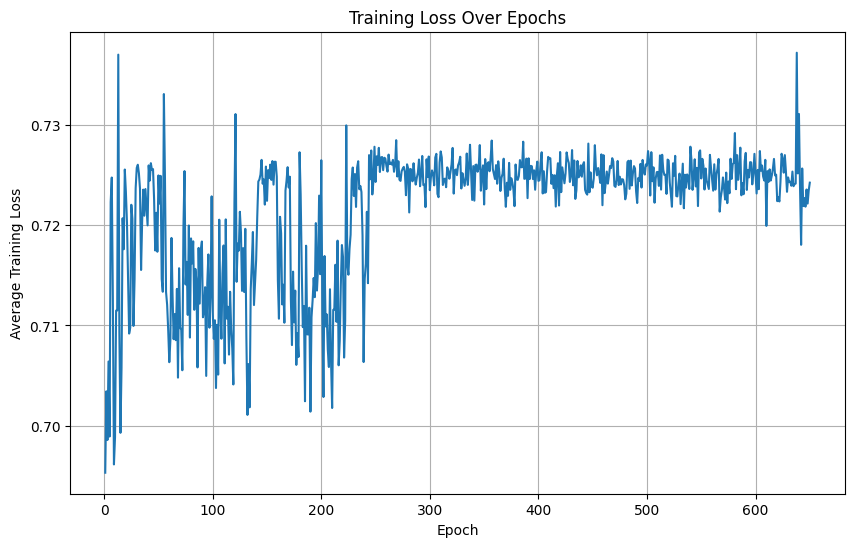

In [46]:
# After the training loop, add the plotting code:
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), epoch_losses)
plt.xlabel('Epoch')
plt.ylabel('Average Training Loss')
plt.title('Training Loss Over Epochs')
plt.grid(True)
plt.show()

In [47]:
def calculate_accuracy(model, features, labels):
  with torch.no_grad():
    inputs = Variable(torch.FloatTensor(features)).to(device)
    labels = Variable(torch.LongTensor(labels)).to(device)
    outputs = model(inputs)
    _, predicted = torch.max(outputs.data, 1)
    correct = (predicted == labels).sum().item()
    total = labels.size(0)
    accuracy = 100 * correct / total
    return accuracy

result1=calculate_accuracy(sonfin, features_train,labels_train)
result2=calculate_accuracy(sonfin, features_test,labels_test)

print("Training Accuracy:", result1)
print("Test Accuracy:", result2)

Training Accuracy: 72.25415070242657
Test Accuracy: 73.8755980861244


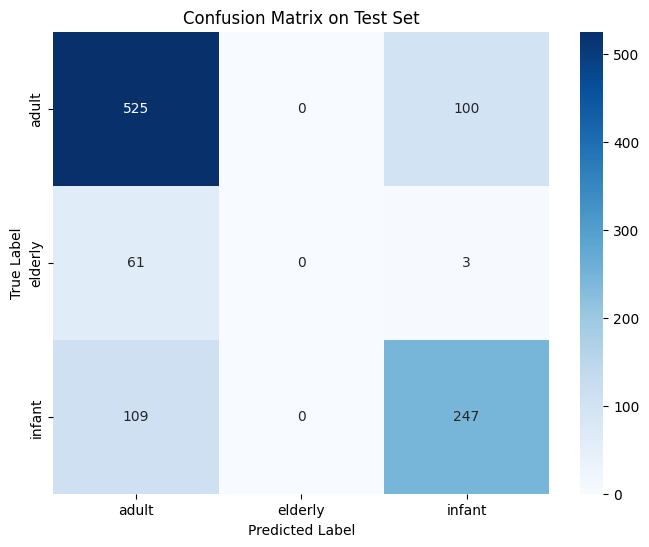

In [51]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get predictions on the test set
with torch.no_grad():
    inputs_test = Variable(torch.FloatTensor(features_test)).to(device)
    labels_test_tensor = Variable(torch.LongTensor(labels_test)).to(device)
    outputs_test = sonfin(inputs_test)
    _, predicted_test = torch.max(outputs_test.data, 1)

# Move predictions and actual labels to CPU for scikit-learn
predicted_test_cpu = predicted_test.cpu().numpy()
labels_test_cpu = labels_test_tensor.cpu().numpy()

# Generate the confusion matrix
cm = confusion_matrix(labels_test_cpu, predicted_test_cpu)

# Get the class labels from the label encoder
class_labels = label_encoder.classes_

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix on Test Set')
plt.show()

In [29]:
%tensorboard --logdir results

<IPython.core.display.Javascript object>

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import torch # Import torch here as it is used in the function

def plot_centers(model):
  # Ensure the model is on CPU for numpy conversion
  model.cpu()
  centers=model.mf_layer.centers.detach().cpu().numpy()
  widths=model.mf_layer.widths.detach().cpu().numpy()

  # Get the actual number of rules and input dimensions from the model
  n_rules = model.mf_layer.n_rules
  input_dim = model.mf_layer.input_dim

  for dim in range (input_dim):
    # Ensure the range of x_axis covers the extent of the membership functions for this dimension
    # Handle case where widths might be very small or zero
    # Clamp widths at a minimum value (e.g., 0.01 or 0.1 as used in the model) for range calculation
    effective_widths = np.maximum(widths[dim], 0.1) # Use clamped width for range calculation
    max_width = effective_widths.max()
    min_center = centers[dim].min()
    max_center = centers[dim].max()

    # Set a reasonable range for the x-axis. Ensure it covers the min/max centers plus some margin based on widths.
    # If min_center and max_center are the same (e.g., only one rule), ensure a default range.
    if min_center == max_center:
        plot_min = min_center - 5 * max_width # Use a larger margin for single center
        plot_max = max_center + 5 * max_width
    else:
        plot_min = min_center - 2 * max_width
        plot_max = max_center + 2 * max_width

    # Ensure the range is not too small or too large by considering typical normalized data range [0, 1]
    plot_min = max(plot_min, -0.5) # Ensure lower bound is reasonable, maybe slightly below 0
    plot_max = min(plot_max, 1.5)  # Ensure upper bound is reasonable, maybe slightly above 1

    # Generate enough points for a smooth curve
    x_axis = np.arange(plot_min, plot_max, (plot_max - plot_min)/1000.0)

    # Create a dummy input tensor where only the 'dim' feature varies
    # The mf_layer forward method expects input shape (batch_size, input_dim)
    # Here, batch_size is len(x_axis) and input_dim is model.mf_layer.input_dim
    dummy_input = torch.zeros(len(x_axis), input_dim).to(device) # Ensure dummy_input is on the correct device
    dummy_input[:, dim] = torch.from_numpy(x_axis).float().to(device) # Ensure x_axis values are on the correct device

    # Pass the dummy input through the mf_layer
    # The mf_layer forward method expects input shape (batch_size, input_dim)
    # and outputs shape (batch_size, input_dim, n_rules)
    y_axis = model.mf_layer(dummy_input) # y_axis shape: (len(x_axis), input_dim, n_rules)

    plt.figure(figsize=(10, 6)) # Optional: Set figure size
    for rule in range (n_rules):
      # y_axis[:, dim, rule] gets the membership values for all x_axis points, for the current dimension 'dim' and current rule 'rule'
      y_rule = y_axis[:, dim, rule].detach().cpu().numpy()
      plt.plot(x_axis, y_rule,label=f'rule{rule}')

    plt.title(f'Membership Functions for Feature {dim}')
    plt.xlabel(f'Normalized Feature {dim} Value')
    plt.ylabel('Membership Value')
    plt.legend()
    plt.grid(True) # Optional: Add grid
    plt.show()

  # Move model back to original device if it was on GPU
  model.to(device)

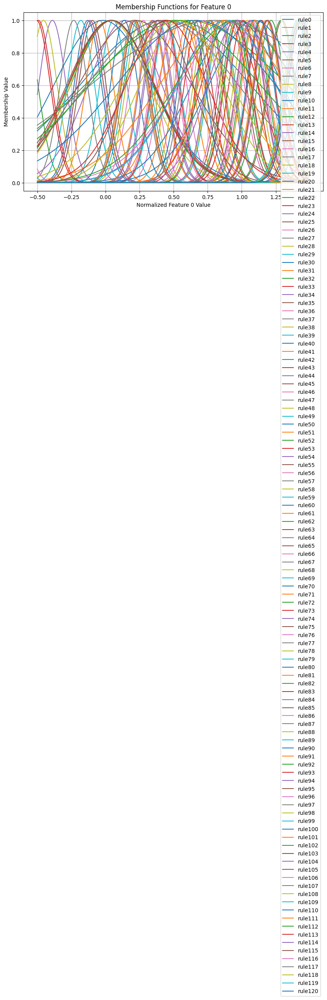

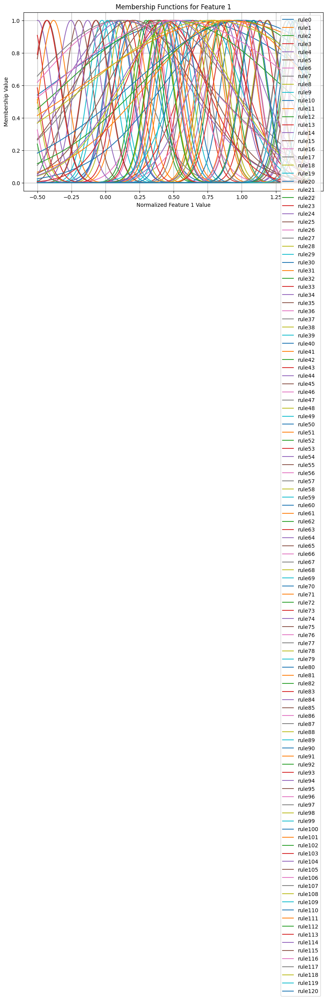

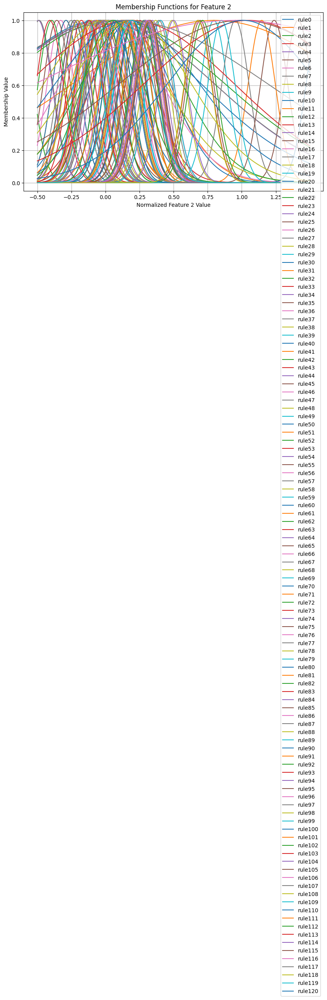

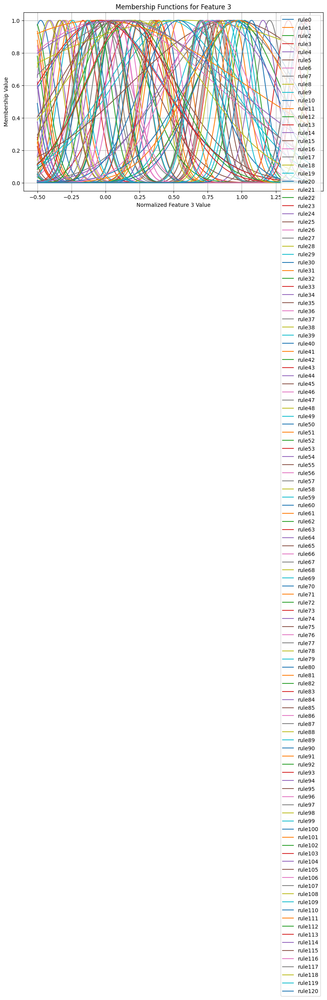

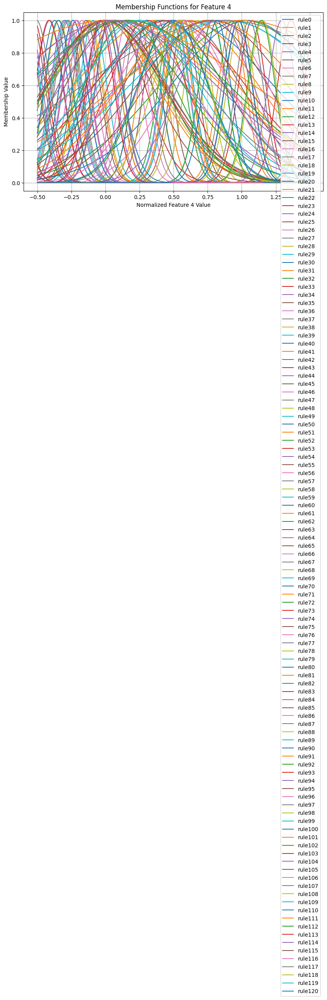

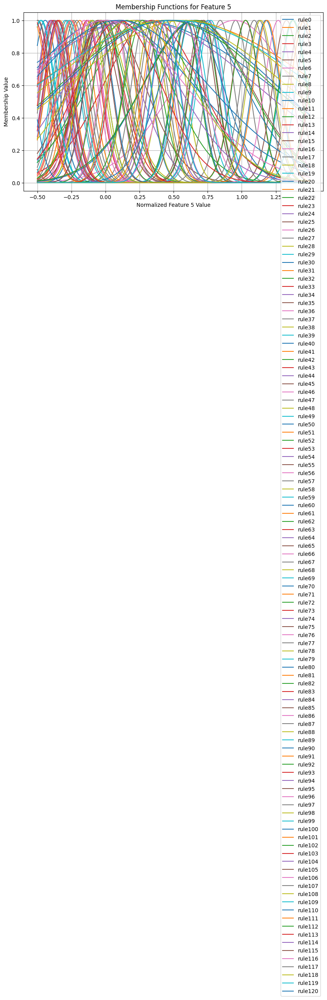

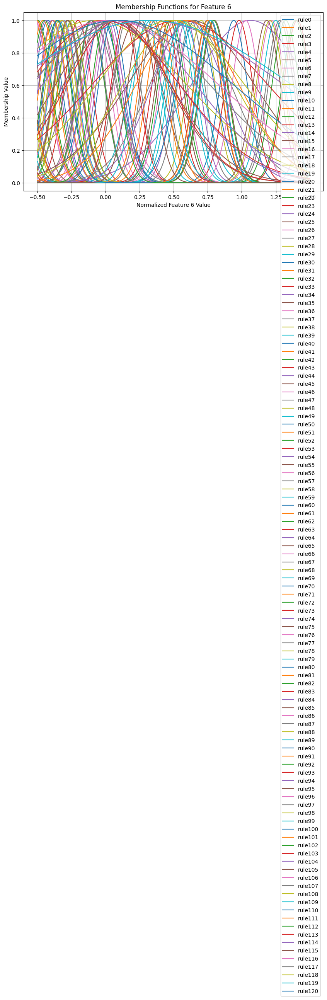

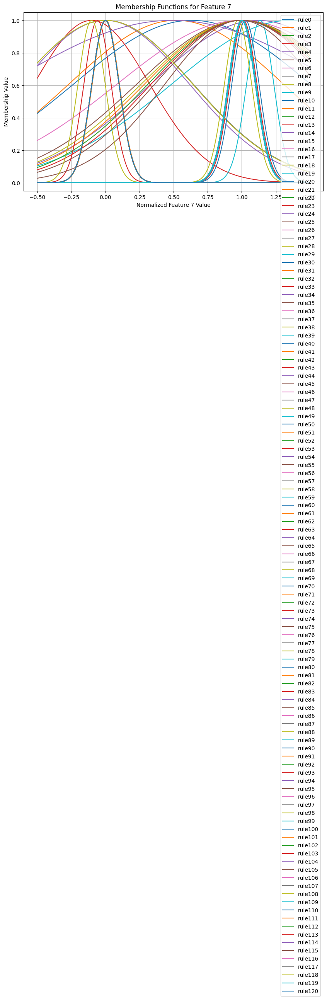

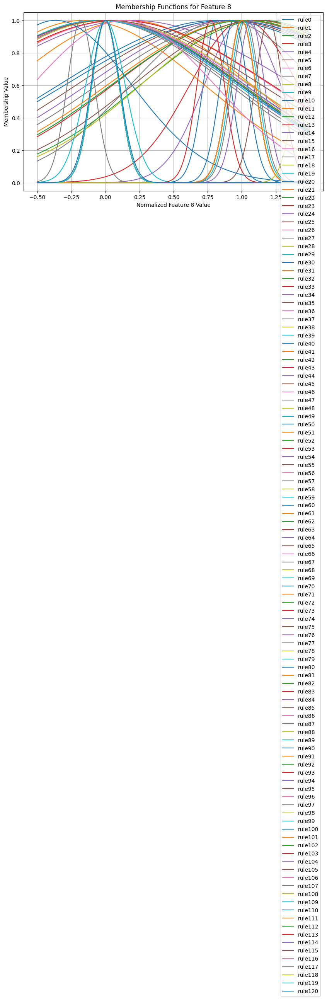

In [50]:
# Let's see what the Membership Funtions look like
plot_centers(sonfin)

Baseline

In [ ]:
# Setting for a potential optimal baseline learning rate
optimizer = torch.optim.SGD(sonfin.parameters(), lr=0.1)

# Setting for a potential optimal baseline batch size and epochs
batch_size = 60
num_epochs = 500 # Keep the original number of epochs for a common starting point

Quicker Convergence

In [ ]:

# Setting for faster convergence learning rate
optimizer = torch.optim.SGD(sonfin.parameters(), lr=0.5) # Your current setting is already good for speed

# Setting for faster convergence batch size and epochs
batch_size = 128
num_epochs = 400 # Reduce the number of epochs as convergence might be faster

More Exploration

In [ ]:
# Setting for more exploration - trying a higher learning rate
optimizer_high_lr = torch.optim.SGD(sonfin.parameters(), lr=1.0)

# Setting for more exploration - trying a smaller batch size
batch_size_small = 32
# Setting for more exploration - trying a larger number of epochs
num_epochs_long = 800